In [4]:
import glob
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

In [5]:
def concatenate_images_with_text(images_left, images_right, label):
    # Assume all images have the same size (width, height)
    image_width, image_height = images_left[0].size

    # Additional space for the text "--generated->" between the images
    space_between_images = 700  # Adjust this value to fit the text comfortably

    # Create a blank image for the row plus text label
    total_width = (len(images_left) + len(images_right)) * image_width + space_between_images
    total_height = image_height * 2  # Double the height to fit images and text
    new_row = Image.new('RGB', (total_width, total_height), (255, 255, 255))  # White background

    draw = ImageDraw.Draw(new_row)

    # Load a font for the text (you might need to provide the font file path)
    try:
        font = ImageFont.truetype("arial.ttf", 100)  # You can adjust the font size
    except IOError:
        font = ImageFont.load_default()

    # Paste the left images (4 images)
    x_offset = 0
    for img in images_left:
        new_row.paste(img, (x_offset, 0))
        x_offset += image_width

    # Add the text "--generated->" in the middle
    generated_text = "--generate->"
    text_bbox = draw.textbbox((0, 0), generated_text, font=font)
    text_width, text_height = text_bbox[2] - text_bbox[0], text_bbox[3] - text_bbox[1]

    # Center the text vertically with the images and horizontally in the space between left and right images
    text_position = (x_offset + (space_between_images - text_width) // 2, (image_height - text_height) // 2)
    draw.text(text_position, generated_text, fill="black", font=font)

    # Move the x_offset to account for the text space
    x_offset += space_between_images

    # Paste the right images (4 images)
    for img in images_right:
        new_row.paste(img, (x_offset, 0))
        x_offset += image_width

    # Get the bounding box for the row's label text (below the images)
    text_bbox = draw.textbbox((0, 0), label, font=font)
    label_text_width, label_text_height = text_bbox[2] - text_bbox[0], text_bbox[3] - text_bbox[1]

    # Draw the label text below the images
    label_text_position = (
    (image_width * 4 - label_text_width) // 2, image_height + (image_height - label_text_height) // 2)
    draw.text(label_text_position, label, fill="black", font=font)

    return new_row

def concatenate_rows_with_texts(all_rows):
    row_width, row_height = all_rows[0].size
    total_width = row_width
    total_height = len(all_rows) * row_height

    # Create a blank image for the final concatenated result
    final_image = Image.new('RGB', (total_width, total_height), (255, 255, 255))

    # Paste each row one below the other
    y_offset = 0
    for row in all_rows:
        final_image.paste(row, (0, y_offset))
        y_offset += row_height

    return final_image

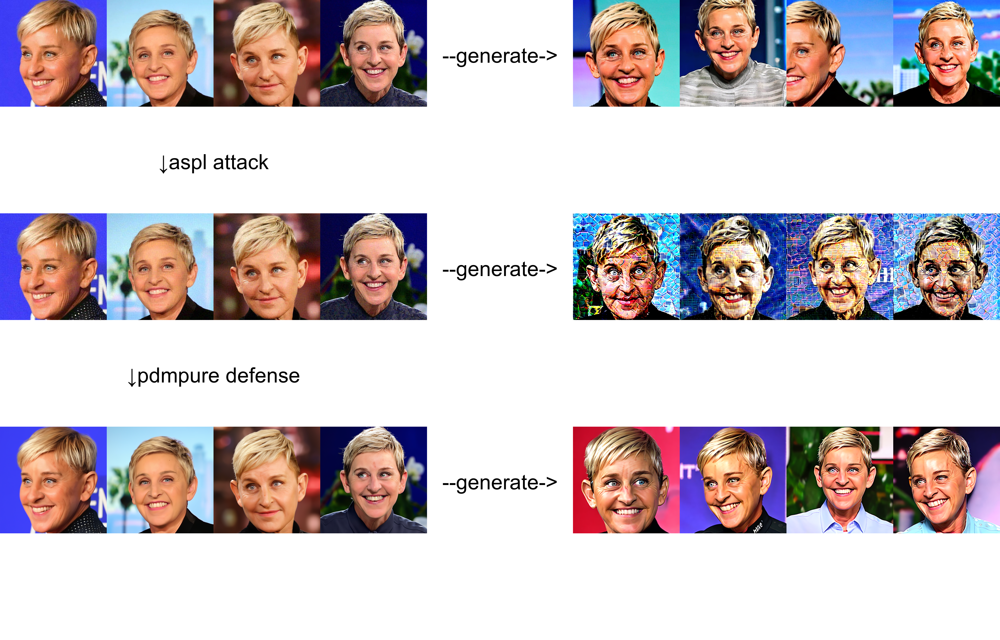

In [7]:
# Load your images (replace with actual paths to your image files)
dataset = 'celeb20'
name = 'ellen'
attack_name = 'aspl'
defense_name = 'pdmpure'
left_images_row1 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}/set_B/*')]
right_images_row1 = [Image.open(i) for i in glob.glob(f'dreambooth-outputs/{name}/checkpoint-1000/dreambooth/a_photo_of_sks_person/*')[6:10]]
extra_images_row1 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}_generated_pdmpure/*')]

left_images_row2 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}_{attack_name}/*')]
right_images_row2 = [Image.open(i) for i in glob.glob(f'dreambooth-outputs/{name}_{attack_name}/checkpoint-1000/dreambooth/a_photo_of_sks_person/*')[:4]]
extra_images_row2 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}_{attack_name}_generated_pdmpure/*')]

left_images_row3 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}_{attack_name}_{defense_name}/*')]
right_images_row3 = [Image.open(i) for i in glob.glob(f'dreambooth-outputs/{name}_{attack_name}_{defense_name}/checkpoint-1000/dreambooth/a_photo_of_sks_person/*')[:4]]
extra_images_row3 = [Image.open(i) for i in glob.glob(f'{dataset}/{name}_{attack_name}_{defense_name}_generated_pdmpure/*')]

# Concatenate images with labels
row1 = concatenate_images_with_text(left_images_row1, right_images_row1,f"↓{attack_name} attack")
row2 = concatenate_images_with_text(left_images_row2, right_images_row2, f"↓{defense_name} defense")
row3 = concatenate_images_with_text(left_images_row3, right_images_row3, "")

# Concatenate all rows into the final image
final_image = concatenate_rows_with_texts([row1, row2, row3])

# Save or display the final image
final_image.save(f'graphs/concatenated_image_with_text_{name}_{attack_name}_{defense_name}.jpg')
display(final_image)